In [1]:
import velvetvae as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
from scipy.ndimage import gaussian_filter
import matplotlib

import pickle 
import colorsys
import random

In [3]:
neural = sc.read_h5ad('../data/neural_data_0606.h5ad')

state_path = '../models/neural_vf_0606_model.pt'

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

trained_state = torch.load(state_path)['model_state_dict']

model.module.load_state_dict(trained_state)

INFO     Generating sequential column names                                                  


<All keys matched successfully>

In [4]:
model.module = model.module.to('cuda')

model.adata.obs['index'] = np.arange(model.adata.shape[0])

vt.sm.VelvetSDE.setup_anndata(
    model, 
    x_layer='total', 
    index_key='index'
)

markov = vt.sb.MarkovProcess(
    model,
    n_neighbors=10,
    use_space='latent_space',
    use_spline=True, 
    use_similarity=False
)

sde = vt.sb.SDE(
    model.module.n_latent,
    prior_vectorfield=model.module.vf,
    noise_scalar=0.1,
    device=model.device
)

sde_model = vt.sm.VelvetSDE(
    model,
    sde,
    markov,
)


sde_state_path = '../models/neural_sde_0606_model.pt'

trained_state_sde = torch.load(sde_state_path)['model_state_dict']

sde_model.module.load_state_dict(trained_state_sde)

KNN indices for Velvet stored in .obsm['knn_index'].


<All keys matched successfully>

In [8]:
import pickle
with open('../data/F4_noisy0.1_trajectories.pickle', 'rb') as f:
    trajectories = pickle.load(f)

In [9]:
mn_traj = trajectories['MN']
v3_traj = trajectories['V3']
fp_traj = trajectories['FP']

In [10]:
def get_plot_data(
    gene_expression,
    gene,
    mean_normalize=True
):
    gene_index = np.where(model.adata.var_names==gene)[0][0]
    gene_data = gene_expression[:,:,gene_index].cpu().numpy()
    
    mu = gene_data.mean(0)
    if mean_normalize:    
        mumax = mu.max()
        gene_data = gene_data / mumax
        mu = mu / mumax
    return gene_data, mu

mn_gex = model.get_trajectory_gene_expression(mn_traj)

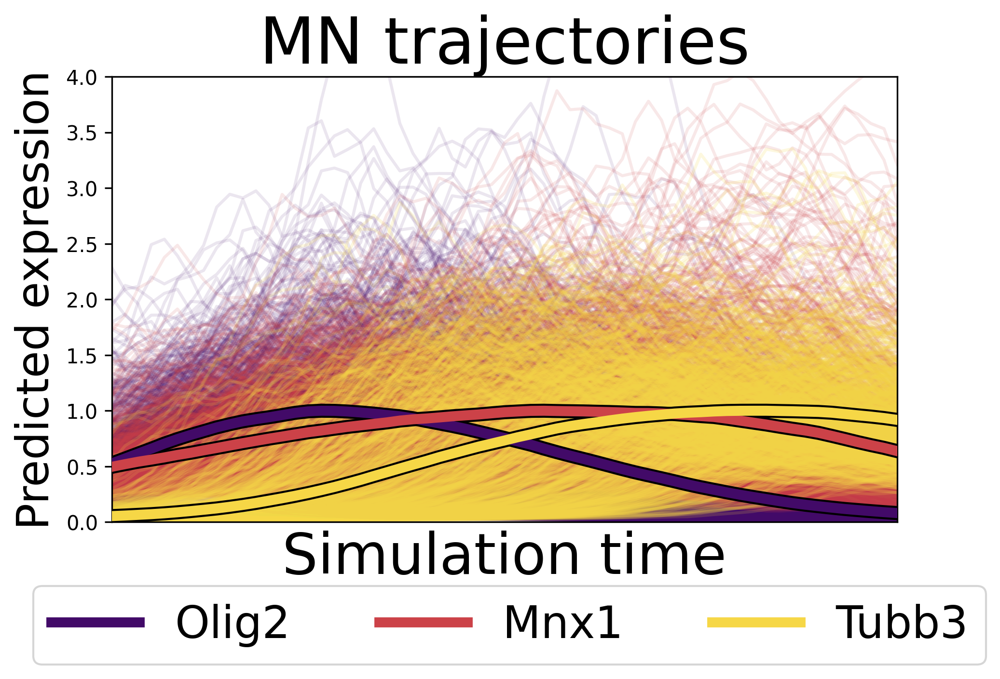

In [20]:
genes = ['Olig2','Mnx1','Tubb3']
genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(mn_gex, gene, mean_normalize=True)
    genedict[gene] = results
    
alphas = [0.1,0.12,.17,0.2]

plt.figure(figsize=(7,4), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts:
        plt.plot(t, color=col, alpha=alf)
    plt.plot(mu, linewidth=5, color=col, label=gene, zorder=10)
    plt.plot(mu, linewidth=7, color='black', zorder=9)

plt.legend(loc=(-0.1,-.32), fontsize=22, ncol=3)
plt.title("MN trajectories", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,60))
plt.ylim((0,4))

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
        
plt.savefig('../figures/3.1.0_MN_trajectories.png', bbox_inches='tight')

plt.show()

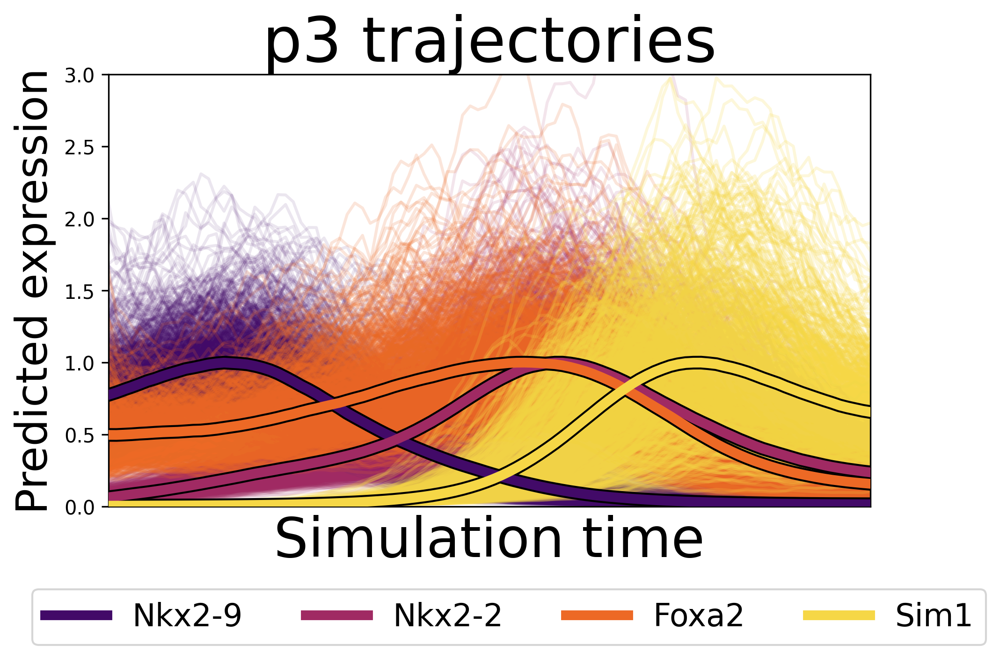

In [24]:
v3_gex = model.get_trajectory_gene_expression(v3_traj)
genes = ['Nkx2-9','Nkx2-2','Foxa2','Sim1']

genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(v3_gex, gene, mean_normalize=True)
    genedict[gene] = results 
    
    
alphas = [0.1,0.12,.17,0.2]

plt.figure(figsize=(7,4), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts:
        plt.plot(t, color=col, alpha=alf)
    plt.plot(mu, linewidth=5, color=col, label=gene, zorder=10)
    plt.plot(mu, linewidth=7, color='black', zorder=9)

plt.legend(loc=(-0.1,-.32), fontsize=16, ncol=4)
plt.title("p3 trajectories", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,99))
plt.ylim((0,3))

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
        
plt.savefig('../figures/3.1.1_p3_trajectories.png', bbox_inches='tight')

plt.show()

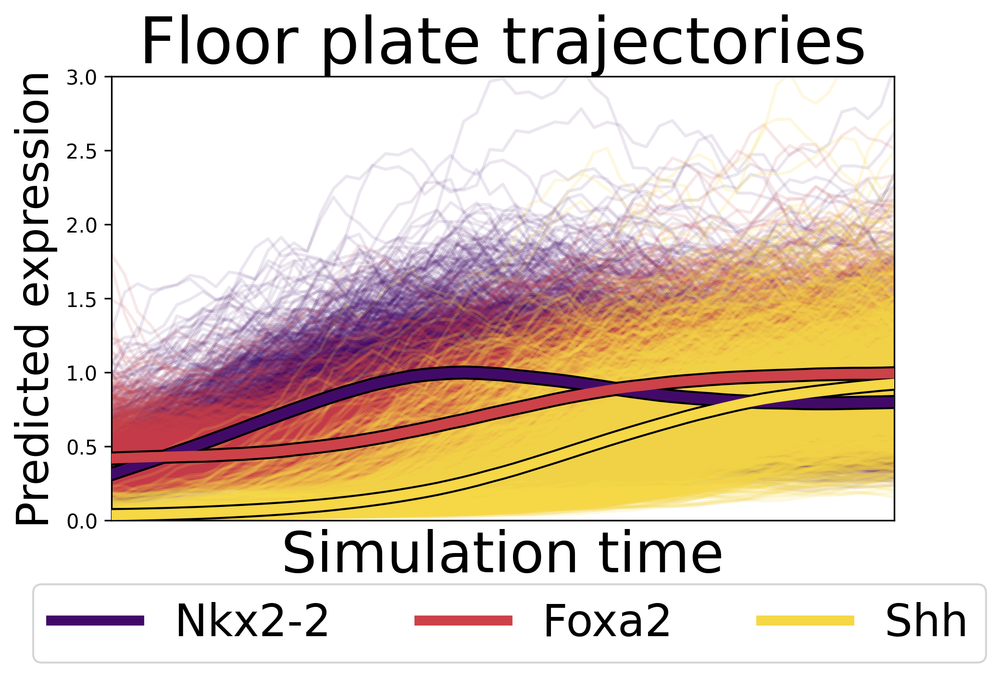

In [27]:
fp_gex = model.get_trajectory_gene_expression(fp_traj)

genes = ['Nkx2-2','Foxa2','Shh']

genedict = {}
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0.2,0.9,len(genes))]
for gene in genes:
    results = get_plot_data(fp_gex, gene, mean_normalize=True)
    genedict[gene] = results 
    
    
alphas = [0.1,0.12,.17,0.2]

plt.figure(figsize=(7,4), dpi=300)
for gene, col, alf in zip(genes, colors, alphas):
    ts = genedict[gene][0]
    mu = genedict[gene][1]
    for t in ts:
        plt.plot(t, color=col, alpha=alf)
    plt.plot(mu, linewidth=5, color=col, label=gene, zorder=10)
    plt.plot(mu, linewidth=7, color='black', zorder=9)

plt.legend(loc=(-0.1,-.32), fontsize=22, ncol=3)
plt.title("Floor plate trajectories", fontsize=32)
plt.ylabel("Predicted expression", fontsize=22)
plt.xticks([])
plt.xlabel("Simulation time", fontsize=28)
plt.xlim((0,60))
plt.ylim((0,3))

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
        
plt.savefig('../figures/3.1.2_FP_trajectories.png', bbox_inches='tight')
plt.show()

# Phase portrait

In [8]:
adata = sc.read_h5ad('../data/celltyped_adata.h5ad')
neural = sc.read_h5ad('../data/neural_data_0606.h5ad')

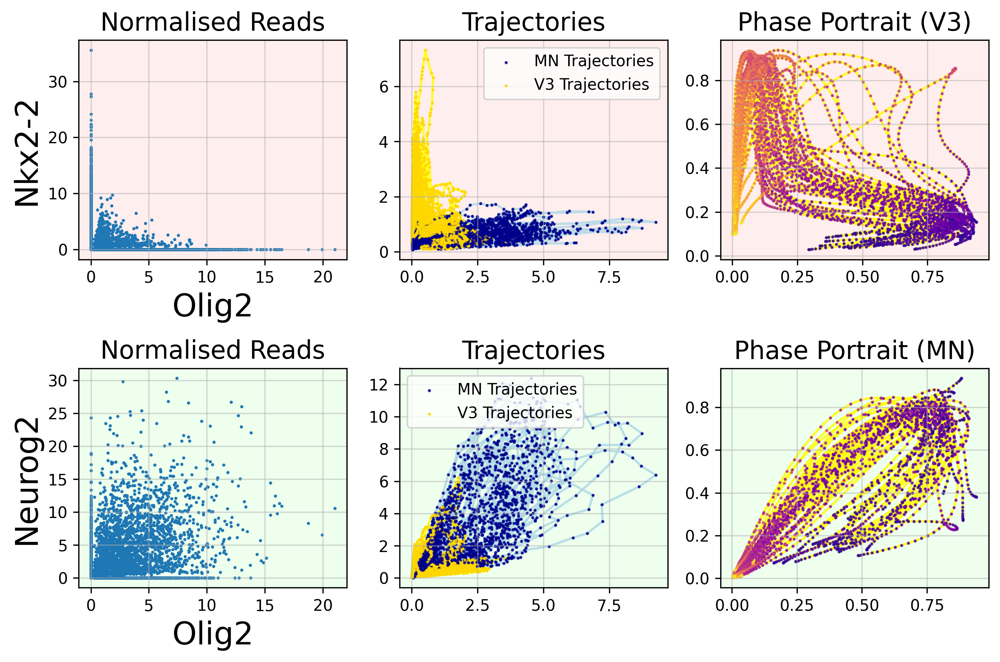

In [6]:
import pickle
with open('../data/F4_noisy_trajectories.pickle', 'rb') as f:
    traj_dict = pickle.load(f)

msc = """ABC
DEF"""

fig, axes = plt.subplot_mosaic(mosaic=msc, figsize=(9,6), dpi=300)

for g1, g2, alf in zip(
    ['Olig2','Olig2'],
    ['Nkx2-2','Neurog2'],
    ['ABC','DEF']
):
    raw = adata[[ct in ['pMN','p3','MN','V3'] for ct in adata.obs.cell_annotation],[g1,g2]]
    raw = raw.layers['total'].A

    norm = neural[[ct in ['pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation],[g1,g2]]
    norm = norm.layers['total']

    x = neural[[ct in ['Neural','pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation]].layers['total']
    x = torch.tensor(x, device=model.device)
    b = torch.zeros(x.shape[0])
    inf = model.module.inference(x,b)

    _, _, mu, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    decoded_means = mu[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_means = decoded_means.detach().cpu().numpy()

    z_future = inf['z'] + inf['vz']

    _, _, px_rate, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    _, _, px_rate_future, _ = model.module.decoder(
        model.module.dispersion,
        z_future,
        inf['library'],
        b,
    )

    vel = px_rate_future - px_rate

    decoded_vel = vel[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_vel = decoded_vel.detach().cpu().numpy()

    gex_mn = model.get_trajectory_gene_expression(traj_dict['MN'])
    gex_v3 = model.get_trajectory_gene_expression(traj_dict['V3'])

    ts1 = gex_mn[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()
    ts2 = gex_v3[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()

    axes[alf[0]].scatter(norm[:,0], norm[:,1], s=1)
    axes[alf[0]].set_xlabel(g1, fontsize=20)
    axes[alf[0]].set_ylabel(g2, fontsize=20)
    axes[alf[0]].set_title("Normalised Reads", fontsize=16)

    for i in range(50):
        if i==1:
            label1 = 'MN Trajectories'
            label2 = 'V3 Trajectories'
        else:
            label1, label2 = '', ''
        axes[alf[1]].scatter(ts1[i,:,0],ts1[i,:,1], color='darkblue', alpha=0.8, s=1, label=label1)
        axes[alf[1]].plot(ts1[i,:,0],ts1[i,:,1], color='lightblue', alpha=0.8, zorder=0)
        axes[alf[1]].scatter(ts2[i,:,0],ts2[i,:,1], color='gold', alpha=0.8, s=1, zorder=1, label=label2)
        axes[alf[1]].plot(ts2[i,:,0],ts2[i,:,1], color='yellow', alpha=0.8, zorder=0)
    axes[alf[1]].legend()
    axes[alf[1]].set_xlabel('')
    axes[alf[1]].set_title("Trajectories", fontsize=16)
    axes[alf[1]].set_ylabel('')
    

    f = lambda x, s: gaussian_filter(x, sigma=s)

    for i in range(50):
        if i==0:
            label1 = 'V3 Trajectories'
        else:
            label1, label2 = '', ''
        if g2 == 'Neurog2':
            x = ts1[i,:,0] / ts1[i,:,0].max()
            y = ts1[i,:,1] / ts1[i,:,1].max()
        else:
            x = ts2[i,:,0] / ts2[i,:,0].max()
            y = ts2[i,:,1] / ts2[i,:,1].max()

        x = f(x, 5)
        y = f(y, 5)
        cmap = matplotlib.cm.get_cmap('plasma')
        colors = cmap(np.linspace(0.05,0.95,x.shape[0]))
        for xi, yi, ci in zip(x,y,colors):
            axes[alf[2]].scatter(xi,yi, color=ci, alpha=0.8, s=1)
        axes[alf[2]].plot(x,y, color='yellow', alpha=0.8, zorder=0)

    axes[alf[2]].set_xlabel('')
    axes[alf[2]].set_ylabel('')
    if g2 == 'Nkx2-2':
        axes[alf[2]].set_title('Phase Portrait (V3)', fontsize=16)
    elif g2 == 'Neurog2':
        axes[alf[2]].set_title('Phase Portrait (MN)', fontsize=16)
    
    axes[alf[0]].grid(alpha=0.5)
    axes[alf[1]].grid(alpha=0.5)
    axes[alf[2]].grid(alpha=0.5)
    
plt.tight_layout()

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')
    for m in msc:
        if m in ['A','B','C']:
            axes[m].set_facecolor((1, 0.6, 0.6, 0.16))
        if m in ['D','E','F']:
            axes[m].set_facecolor((0.6, 1, 0.6, 0.16))
        
plt.tight_layout()
plt.savefig('../figures/3.1.3_phase_portraits.png', bbox_inches='tight')
plt.show()


# Reworking

In [11]:
adata = sc.read_h5ad('../data/celltyped_adata.h5ad')
neural = sc.read_h5ad('../data/neural_data_0606.h5ad')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


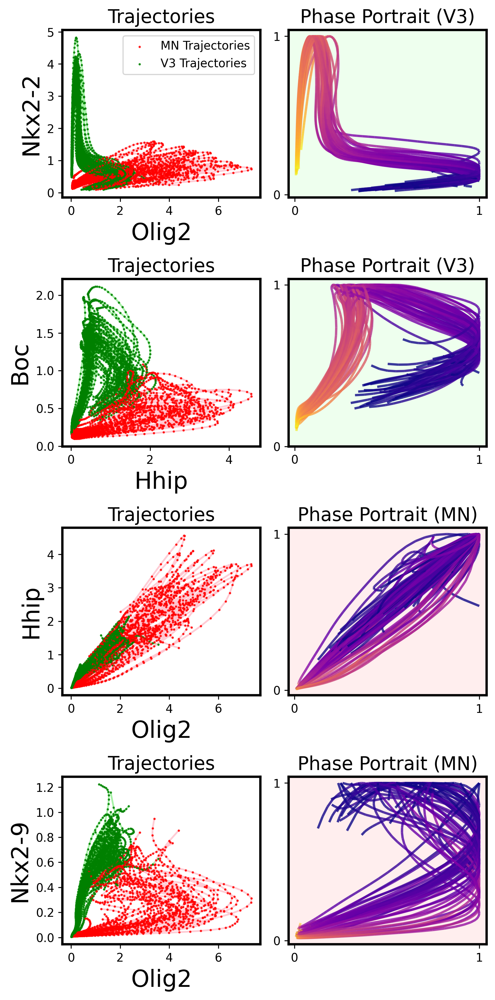

In [21]:
from matplotlib.collections import LineCollection
import pickle
with open('../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
    traj_dict = pickle.load(f)

msc = """AB
CD
EF
GH"""

fig, axes = plt.subplot_mosaic(mosaic=msc, figsize=(6,12), dpi=300)

for g1, g2, alf, dom in zip(
    ['Olig2','Hhip','Olig2','Olig2'],
    ['Nkx2-2','Boc','Hhip','Nkx2-9'],
    ['AB','CD','EF','GH'],
    ['V3','V3','MN','MN'],
):
    raw = adata[[ct in ['pMN','p3','MN','V3'] for ct in adata.obs.cell_annotation],[g1,g2]]
    raw = raw.layers['total'].A

    norm = neural[[ct in ['pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation],[g1,g2]]
    norm = norm.layers['total']

    x = neural[[ct in ['Neural','pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation]].layers['total']
    x = torch.tensor(x, device=model.device)
    b = torch.zeros(x.shape[0])
    inf = model.module.inference(x,b)

    _, _, mu, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    decoded_means = mu[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_means = decoded_means.detach().cpu().numpy()

    z_future = inf['z'] + inf['vz']

    _, _, px_rate, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    _, _, px_rate_future, _ = model.module.decoder(
        model.module.dispersion,
        z_future,
        inf['library'],
        b,
    )

    vel = px_rate_future - px_rate

    decoded_vel = vel[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_vel = decoded_vel.detach().cpu().numpy()

    gex_mn = model.get_trajectory_gene_expression(traj_dict['MN'])
    gex_v3 = model.get_trajectory_gene_expression(traj_dict['V3'])

    ts1 = gex_mn[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()
    ts2 = gex_v3[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()

    for i in range(50):
        if alf=='AB':
            if i==1:
                label1 = 'MN Trajectories'
                label2 = 'V3 Trajectories'
            else:
                label1, label2 = '', ''
            axes[alf[0]].legend()
        axes[alf[0]].scatter(ts1[i,:,0],ts1[i,:,1], color='red', alpha=0.8, s=1, label=label1)
        axes[alf[0]].plot(ts1[i,:,0],ts1[i,:,1], color='pink', alpha=0.8, zorder=0)
        axes[alf[0]].scatter(ts2[i,:,0],ts2[i,:,1], color='green', alpha=0.8, s=1, zorder=1, label=label2)
        axes[alf[0]].plot(ts2[i,:,0],ts2[i,:,1], color='lightgreen', alpha=0.8, zorder=0)
    axes[alf[0]].set_xlabel(g1, fontsize=20)
    axes[alf[0]].set_title("Trajectories", fontsize=16)
    axes[alf[0]].set_ylabel(g2, fontsize=20)
    

#     f = lambda x, s: x # gaussian_filter(x, sigma=s)

    for i in range(50):
        label1, label2 = '', ''
        if dom == 'MN':
            x = ts1[i,:,0] / ts1[i,:,0].max()
            y = ts1[i,:,1] / ts1[i,:,1].max()
        else:
            x = ts2[i,:,0] / ts2[i,:,0].max()
            y = ts2[i,:,1] / ts2[i,:,1].max()

#         x = f(x, 3)
#         y = f(y, 3)
#         cmap = matplotlib.cm.get_cmap('plasma')
#         colors = cmap(np.linspace(0.05,0.95,x.shape[0]))
#         for xi, yi, ci in zip(x,y,colors):
#             axes[alf[1]].scatter(xi,yi, color=ci, alpha=0.8, s=1)
#         axes[alf[1]].plot(x,y, color='yellow', alpha=0.8, zorder=0)

        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        cmap = plt.get_cmap('plasma')
        lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, 1))
        lc.set_array(np.linspace(0, 1, len(x)))
        lc.set_linewidth(2)
        lc.set_alpha(0.8)

        # Add collection to the specified axes
        axes[alf[1]].add_collection(lc)
        axes[alf[1]].autoscale()
        axes[alf[1]].margins(0.04)

        
    axes[alf[1]].set_xlabel('')
    axes[alf[1]].set_ylabel('')
    if dom == 'V3':
        axes[alf[1]].set_title('Phase Portrait (V3)', fontsize=16)
    elif dom == 'MN':
        axes[alf[1]].set_title('Phase Portrait (MN)', fontsize=16)

    
plt.tight_layout()

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    fig.patch.set_facecolor('none')
    for m in msc:
        if m in ['B','D']:
            axes[m].set_facecolor((0.6, 1, 0.6, 0.16))
            axes[m].set_xticks([0,1])
            axes[m].set_yticks([0,1])
        if m in ['F','H']:
            axes[m].set_facecolor((1, 0.6, 0.6, 0.16))
            axes[m].set_xticks([0,1])
            axes[m].set_yticks([0,1])

            
for m in 'ABCDEFGH':
    for spine in axes[m].spines.values():
        spine.set_visible(True)  
        spine.set_color('black')  
        spine.set_linewidth(2) 
        
plt.tight_layout()
plt.savefig('../figures/3.1.4_phase_portraits_new.png', bbox_inches='tight')
plt.show()


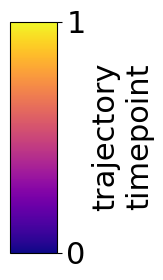

In [30]:
import matplotlib.pyplot as plt
import matplotlib as mpl

# Create a norm object for the colorbar
norm = mpl.colors.Normalize(vmin=0, vmax=1)

fig, ax = plt.subplots(figsize=(.6, 3))

# Define the colorbar
cbar = mpl.colorbar.ColorbarBase(ax, cmap='plasma', norm=norm, orientation='vertical')

# Define the colorbar labels
cbar.set_ticks([0, 1])
cbar.ax.tick_params(labelsize=22)
cbar.set_label('trajectory\ntimepoint', fontsize=22)


for fig in plt.get_fignums():
    fig = plt.figure(fig)
    fig.patch.set_facecolor('none')        
plt.tight_layout()
plt.savefig('../figures/3.1.4_heatmap.png', bbox_inches='tight')


plt.show()

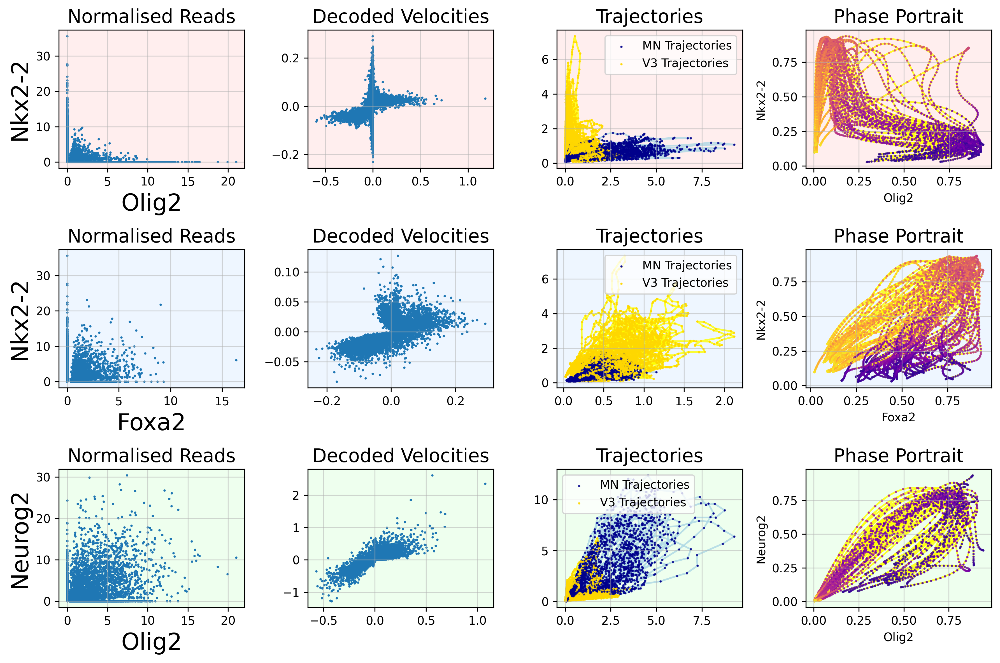

In [27]:
import pickle
with open('../data/F4_noisy_trajectories.pickle', 'rb') as f:
    traj_dict = pickle.load(f)

msc = """ABCD
EFGH
IJKL"""

fig, axes = plt.subplot_mosaic(mosaic=msc, figsize=(12,8), dpi=300)

for g1, g2, alf in zip(
    ['Olig2','Foxa2','Olig2'],
    ['Nkx2-2','Nkx2-2','Neurog2'],
    ['ABCD','EFGH','IJKL']
):
    raw = adata[[ct in ['pMN','p3','MN','V3'] for ct in adata.obs.cell_annotation],[g1,g2]]
    raw = raw.layers['total'].A

    norm = neural[[ct in ['pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation],[g1,g2]]
    norm = norm.layers['total']

    x = neural[[ct in ['Neural','pMN','p3','MN','V3'] for ct in neural.obs.cell_annotation]].layers['total']
    x = torch.tensor(x, device=model.device)
    b = torch.zeros(x.shape[0])
    inf = model.module.inference(x,b)

    _, _, mu, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    decoded_means = mu[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_means = decoded_means.detach().cpu().numpy()

    z_future = inf['z'] + inf['vz']

    _, _, px_rate, _ = model.module.decoder(
        model.module.dispersion,
        inf['z'],
        inf['library'],
        b,
    )

    _, _, px_rate_future, _ = model.module.decoder(
        model.module.dispersion,
        z_future,
        inf['library'],
        b,
    )

    vel = px_rate_future - px_rate

    decoded_vel = vel[:,list(np.where([v in [g1, g2] for v in neural.var_names])[0])]
    decoded_vel = decoded_vel.detach().cpu().numpy()

    gex_mn = model.get_trajectory_gene_expression(traj_dict['MN'])
    gex_v3 = model.get_trajectory_gene_expression(traj_dict['V3'])

    ts1 = gex_mn[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()
    ts2 = gex_v3[:,:,[np.where(neural.var_names==g1)[0][0],np.where(neural.var_names==g2)[0][0]]].detach().cpu().numpy()

    axes[alf[0]].scatter(norm[:,0], norm[:,1], s=1)
    axes[alf[0]].set_xlabel(g1, fontsize=20)
    axes[alf[0]].set_ylabel(g2, fontsize=20)
    axes[alf[0]].set_title("Normalised Reads", fontsize=16)

    axes[alf[1]].scatter(decoded_vel[:,0], decoded_vel[:,1], s=1)
    axes[alf[1]].set_xlabel('', fontsize=16)
    axes[alf[1]].set_ylabel('', fontsize=16)
    axes[alf[1]].set_title("Decoded Velocities", fontsize=16)

    for i in range(50):
        if i==1:
            label1 = 'MN Trajectories'
            label2 = 'V3 Trajectories'
        else:
            label1, label2 = '', ''
        axes[alf[2]].scatter(ts1[i,:,0],ts1[i,:,1], color='darkblue', alpha=0.8, s=1, label=label1)
        axes[alf[2]].plot(ts1[i,:,0],ts1[i,:,1], color='lightblue', alpha=0.8, zorder=0)
        axes[alf[2]].scatter(ts2[i,:,0],ts2[i,:,1], color='gold', alpha=0.8, s=1, zorder=1, label=label2)
        axes[alf[2]].plot(ts2[i,:,0],ts2[i,:,1], color='yellow', alpha=0.8, zorder=0)
    axes[alf[2]].legend()
    axes[alf[2]].set_xlabel('')
    axes[alf[2]].set_title("Trajectories", fontsize=16)
    axes[alf[2]].set_ylabel('')

    f = lambda x, s: gaussian_filter(x, sigma=s)

    for i in range(50):
        if i==0:
            label1 = 'V3 Trajectories'
        else:
            label1, label2 = '', ''
        if g2 == 'Neurog2':
            x = ts1[i,:,0] / ts1[i,:,0].max()
            y = ts1[i,:,1] / ts1[i,:,1].max()
        else:
            x = ts2[i,:,0] / ts2[i,:,0].max()
            y = ts2[i,:,1] / ts2[i,:,1].max()

        x = f(x, 5)
        y = f(y, 5)
        cmap = matplotlib.cm.get_cmap('plasma')
        colors = cmap(np.linspace(0.05,0.95,x.shape[0]))
        for xi, yi, ci in zip(x,y,colors):
            axes[alf[3]].scatter(xi,yi, color=ci, alpha=0.8, s=1)
        axes[alf[3]].plot(x,y, color='yellow', alpha=0.8, zorder=0)

    axes[alf[3]].set_xlabel(g1)
    axes[alf[3]].set_ylabel(g2)
    axes[alf[3]].set_title('Phase Portrait', fontsize=16)
    
    axes[alf[0]].grid(alpha=0.5)
    axes[alf[1]].grid(alpha=0.5)
    axes[alf[2]].grid(alpha=0.5)
    axes[alf[3]].grid(alpha=0.5)
    
plt.tight_layout()

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')
    for m in msc:
        if m in ['A','B','C','D']:
            axes[m].set_facecolor((1, 0.6, 0.6, 0.16))
        if m in ['E','F','G','H']:
            axes[m].set_facecolor((0.6, 0.8, 1, 0.16))
        if m in ['I','J','K','L']:
            axes[m].set_facecolor((0.6, 1, 0.6, 0.16))
        
plt.tight_layout()
plt.savefig('../figures/3.1.3_phase_portraits.png', bbox_inches='tight')
plt.show()
